# Topic : Military Aircraft Detection using YOLO (v8, v9, v10, 11)

In [1]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
Setup complete  (12 CPUs, 15.7 GB RAM, 181.7/475.7 GB disk)


In [ ]:
# function for converting the annonated values into YOLO format

def convert_to_yolo_format(row, image_width, image_height):
    class_id = row['class']  # You can map this to class indices if necessary
    xmin = row['xmin']
    ymin = row['ymin']
    xmax = row['xmax']
    ymax = row['ymax']

    # Calculate YOLO format
    x_center = (xmin + xmax) / 2.0 / image_width
    y_center = (ymin + ymax) / 2.0 / image_height
    width = (xmax - xmin) / image_width
    height = (ymax - ymin) / image_height

    return f"{class_id} {x_center} {y_center} {width} {height}"

### Splitting the dataset into 80% train, 10% validation & 10% test data

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil

# Folder paths
image_folder = 'C:\\Users\\BISWAJIT\\Downloads\\Military Aircrafts\\images'
csv_file = 'C:\\Users\\BISWAJIT\\Downloads\\Military Aircrafts\\combined_annotations.csv'
output_folder = 'C:\\Users\\BISWAJIT\\Downloads\\Military Aircrafts\\split_dataset'

# Load the combined annotations CSV
annotations_df = pd.read_csv(csv_file)

# Ensure image filenames are unique
unique_images = annotations_df['filename'].unique()

# Split into train, validation, and test sets
train_images, test_images = train_test_split(unique_images, test_size=0.2, random_state=42)
val_images, test_images = train_test_split(test_images, test_size=0.5, random_state=42)  # 10% validation, 10% test

# Function to copy images and their corresponding annotation
def copy_files(image_list, split_type):
    image_output_folder = os.path.join(output_folder, 'images', split_type)
    label_output_folder = os.path.join(output_folder, 'labels', split_type)
    
    os.makedirs(image_output_folder, exist_ok=True)
    os.makedirs(label_output_folder, exist_ok=True)

    for image_name in image_list:
        # Copy image
        src_image_path = os.path.join(image_folder, f"{image_name}.jpg")  # Adjust extension if necessary
        dst_image_path = os.path.join(image_output_folder, f"{image_name}.jpg")
        
        if os.path.exists(src_image_path):
            shutil.copy(src_image_path, dst_image_path)
        
        # Create YOLO annotation file
        image_annotations = annotations_df[annotations_df['filename'] == image_name]
        
        with open(os.path.join(label_output_folder, f"{image_name}.txt"), 'w') as f:
            for _, row in image_annotations.iterrows():
                yolo_format = convert_to_yolo_format(row, row['width'], row['height'])
                f.write(yolo_format + '\n')

# Copy files to corresponding train, validation, and test folders
copy_files(train_images, 'train')
copy_files(val_images, 'val')
copy_files(test_images, 'test')

print("Dataset successfully split into train, validation, and test sets!")

## Applying YOLOv8s

In [4]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model 
model = YOLO('yolov8s.pt')

# Train the model using the YAML configuration file
model.train(
    data = r"C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml",  # Path to the YAML file
    imgsz= 640,                 # Image size for training
    epochs  = 30,                 # Number of epochs
    batch = 16,                  # Batch size
    name = 'yolo_aircraft_detection using YOLOv8'  # Name for the training run
)

New https://pypi.org/project/ultralytics/8.3.23 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.pt, data=C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolo_aircraft_detection using YOLOv8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=

train: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\train\labels.cache... 14186 images, 0 backgrounds, 0 corrupt
val: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\val\labels.cache... 1773 images, 0 backgrounds, 0 corrupt: 100


Plotting labels to runs\detect\yolo_aircraft_detection using YOLOv8\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00013, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\yolo_aircraft_detection using YOLOv8
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      4.02G     0.9757      4.336      1.234         42        640: 100%|██████████| 887/887 [07:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:48


                   all       1773       3141      0.225      0.113     0.0471     0.0387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.05G     0.8875      3.131      1.155         43        640: 100%|██████████| 887/887 [08:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:38


                   all       1773       3141      0.292      0.192      0.114     0.0934

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.29G     0.8656      2.775      1.132         56        640:  86%|████████▋ | 767/887 [05:58<00:52,  

                   all       1773       3141      0.316      0.234      0.174      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      3.98G     0.8381      2.522      1.115         42        640: 100%|██████████| 887/887 [06:53<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.379      0.283       0.24      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      4.03G     0.8057      2.301      1.099         46        640: 100%|██████████| 887/887 [07:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:38


                   all       1773       3141      0.416      0.325      0.304      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.03G     0.7938      2.135      1.082         21        640: 100%|██████████| 887/887 [07:31<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:39


                   all       1773       3141      0.494       0.36      0.338      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.09G     0.7654      1.987      1.072         30        640: 100%|██████████| 887/887 [07:15<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:41


                   all       1773       3141      0.414      0.413      0.389      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.03G     0.7521       1.88      1.063         31        640: 100%|██████████| 887/887 [07:33<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.475      0.418      0.431      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.14G     0.7345      1.767      1.054         35        640: 100%|██████████| 887/887 [07:51<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.492      0.442      0.459      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      4.06G     0.7267      1.681      1.046         41        640: 100%|██████████| 887/887 [07:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.523      0.476      0.492      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.31G     0.7174      1.599      1.041         53        640: 100%|██████████| 887/887 [07:51<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.558      0.471      0.518      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.19G     0.7024      1.524      1.033         31        640: 100%|██████████| 887/887 [07:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.548      0.513      0.544       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.24G     0.6874      1.446      1.027         36        640: 100%|██████████| 887/887 [07:54<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.599      0.521      0.584      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.13G     0.6789      1.398      1.019         22        640: 100%|██████████| 887/887 [07:53<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.638      0.515      0.565      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.09G     0.6711      1.329      1.015         43        640: 100%|██████████| 887/887 [07:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:44


                   all       1773       3141      0.645      0.529        0.6      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      4.22G     0.6623      1.281      1.014         27        640: 100%|██████████| 887/887 [07:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:43


                   all       1773       3141      0.691      0.515      0.609      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      4.03G     0.6449      1.227      1.004         54        640: 100%|██████████| 887/887 [07:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141       0.69      0.534      0.633       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      3.99G     0.6431      1.199      1.002         80        640: 100%|██████████| 887/887 [07:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.689      0.558      0.645      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       4.2G     0.6388      1.155     0.9987         40        640: 100%|██████████| 887/887 [07:53<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.652      0.586      0.642      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      4.18G     0.6311       1.12     0.9949         37        640: 100%|██████████| 887/887 [07:54<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.685      0.576      0.652      0.568
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      4.02G     0.5179     0.8174     0.9258         17        640: 100%|██████████| 887/887 [07:31<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:40


                   all       1773       3141      0.716      0.547      0.647      0.567

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      3.98G     0.5056      0.765     0.9179         11        640: 100%|██████████| 887/887 [07:30<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.704      0.569      0.659      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      4.15G     0.4964      0.723     0.9115         16        640: 100%|██████████| 887/887 [07:33<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.752      0.571      0.676       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      4.11G     0.4883     0.6931     0.9066         12        640: 100%|██████████| 887/887 [07:29<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.732      0.559      0.665      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      4.15G     0.4783     0.6548     0.8993         13        640: 100%|██████████| 887/887 [07:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:42


                   all       1773       3141      0.721      0.579      0.682      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      4.16G     0.4701     0.6301     0.8982         13        640: 100%|██████████| 887/887 [08:52<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141      0.721      0.591      0.683        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      4.09G     0.4632     0.5976     0.8951         33        640: 100%|██████████| 887/887 [09:20<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:50


                   all       1773       3141      0.707      0.602      0.682      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      4.22G      0.457     0.5781     0.8908         16        640: 100%|██████████| 887/887 [09:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141      0.706       0.59      0.675      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      4.11G     0.4515     0.5549     0.8888         12        640: 100%|██████████| 887/887 [07:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:39


                   all       1773       3141      0.766      0.555      0.681      0.602

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      4.13G     0.4443     0.5392     0.8833         15        640: 100%|██████████| 887/887 [07:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:39


                   all       1773       3141      0.752      0.576      0.678      0.599

30 epochs completed in 4.319 hours.
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLOv8\weights\last.pt, 22.5MB
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLOv8\weights\best.pt, 22.5MB

Validating runs\detect\yolo_aircraft_detection using YOLOv8\weights\best.pt...
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
Model summary (fused): 168 layers, 11,153,835 parameters, 0 gradients, 28.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:38


                   all       1773       3141      0.769      0.556      0.681      0.602
                   A10         51         78      0.919       0.59      0.796      0.703
                 A400M         33         45      0.857      0.689      0.747      0.716
                 AG600         19         19      0.894      0.789      0.882       0.86
                  AH64         21         30      0.528      0.533      0.611      0.414
                  AV8B         35         50       0.56       0.54      0.474      0.439
                 An124          5          6       0.86      0.333      0.579      0.503
                  An22          1          1      0.418          1      0.995      0.995
                 An225          4          4      0.651        0.5      0.638      0.606
                  An72         15         20      0.902      0.459      0.675      0.628
                    B1         55         86      0.849      0.656      0.817      0.716
                    B

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002067EC5ADF0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026, 

### Detecting the aircrafts

In [1]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ultralytics import YOLO  # Ensure this import works with your YOLO model setup

def detect_and_display_images(image_paths, model_path, output_folder="output", img_size=640, conf=0.5):
    # Load the trained YOLO model
    model = YOLO(model_path)

    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    for input_image_path in image_paths:
        # Check if the input image exists
        if not os.path.isfile(input_image_path):
            print(f"File not found: {input_image_path}. Skipping.")
            continue

        # Run inference
        results = model.predict(source=input_image_path, imgsz=img_size, conf=conf)

        # Save the result images
        for result in results:
            # Define output image path
            base_name = os.path.basename(input_image_path)
            output_image_path = os.path.join(output_folder, f"detected_{base_name}")

            # Save the output image (Adjust as necessary for your YOLO version)
            result.save(output_image_path)  # Adjust based on your YOLO library version

            # Load the image for display
            img = mpimg.imread(output_image_path)

            # Plot the image
            plt.imshow(img)
            plt.axis('off')  # Optional: Turn off axis labels
            plt.title(f"Detected: {base_name}")  # Add title for clarity
            plt.show()

def get_image_paths_from_directory(directory, num_images=10):
    # List all files in the directory
    all_files = os.listdir(directory)

    # Filter for image files (adjust extensions as needed)
    image_files = [f for f in all_files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Get the full paths and limit to the first num_images
    image_paths = [os.path.join(directory, f) for f in image_files[:num_images]]
    return image_paths

WARNING  Python>=3.10 is required, but Python==3.8.18 is currently installed 



image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00010041af654d0b8e1e16c824fa9867.jpg: 640x448 1 UH60, 157.7ms
Speed: 8.0ms preprocess, 157.7ms inference, 1329.9ms postprocess per image at shape (1, 3, 640, 448)


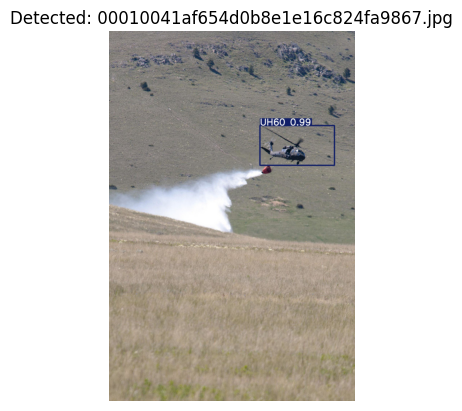


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000106393cfe2343888c584e65fd2274.jpg: 480x640 1 F16, 144.9ms
Speed: 8.9ms preprocess, 144.9ms inference, 4.3ms postprocess per image at shape (1, 3, 480, 640)


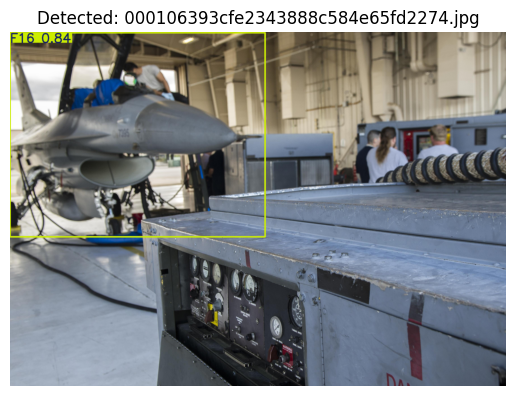


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0002f2cc10d90392efc3ad30cbda6490.jpg: 288x640 8 H6s, 192.4ms
Speed: 5.1ms preprocess, 192.4ms inference, 6.4ms postprocess per image at shape (1, 3, 288, 640)


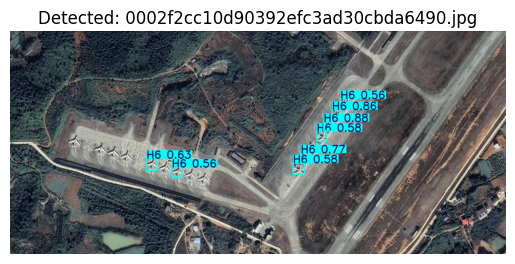


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00032844ab679240fc03ecd27d29a6aa.jpg: 480x640 (no detections), 53.5ms
Speed: 6.0ms preprocess, 53.5ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


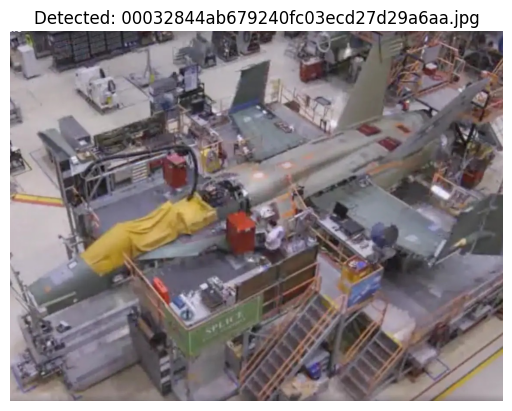


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0003f56298fa8999168d7988a2e9549d.jpg: 448x640 1 F22, 158.0ms
Speed: 6.0ms preprocess, 158.0ms inference, 5.0ms postprocess per image at shape (1, 3, 448, 640)


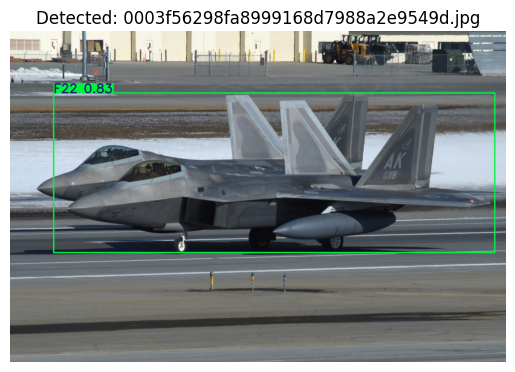


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000aa01b25574f28b654718db0700f72.jpg: 448x640 1 B52, 1 F35, 2 JAS39s, 49.0ms
Speed: 7.0ms preprocess, 49.0ms inference, 5.0ms postprocess per image at shape (1, 3, 448, 640)


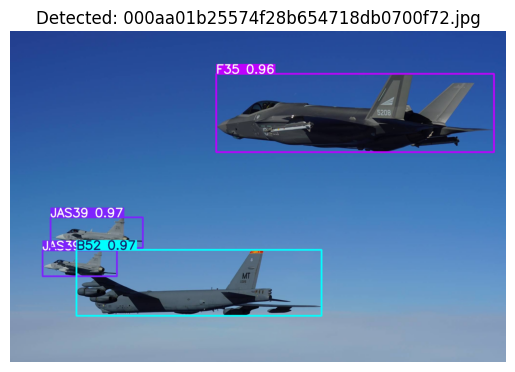


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000b7e09368a2500506063d27d90fcc0.jpg: 448x640 1 JH7, 49.3ms
Speed: 8.4ms preprocess, 49.3ms inference, 8.3ms postprocess per image at shape (1, 3, 448, 640)


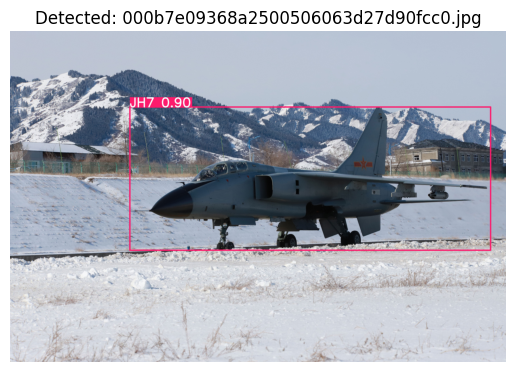


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000e7662268a1071827c5a8663e773f9.jpg: 480x640 1 US2, 55.7ms
Speed: 7.4ms preprocess, 55.7ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)


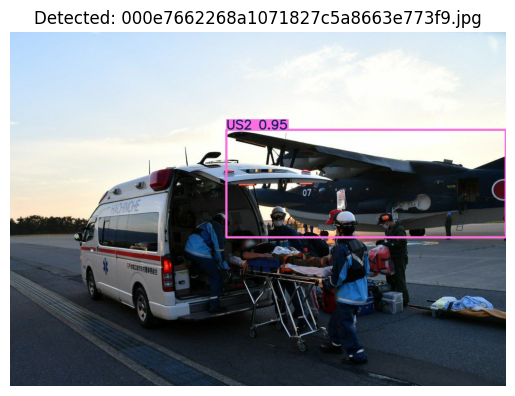


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000ec980b5b17156a55093b4bd6004ab.jpg: 384x640 1 Be200, 163.3ms
Speed: 6.0ms preprocess, 163.3ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)


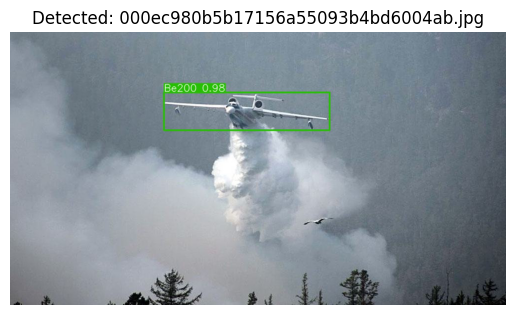


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0036c2784a5b8b2a4a1a4bd9109eb2f7.jpg: 416x640 1 EF2000, 157.5ms
Speed: 7.1ms preprocess, 157.5ms inference, 5.0ms postprocess per image at shape (1, 3, 416, 640)


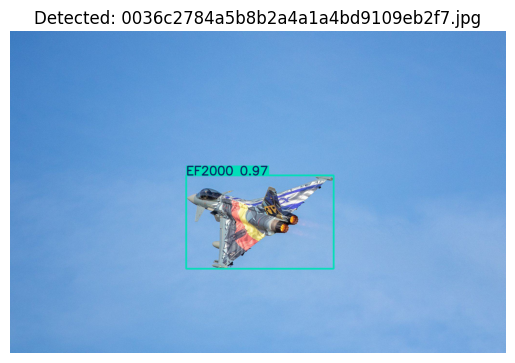

In [2]:
# Example usage
input_directory = r"C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images"
model_path = r"C:\\Users\\BISWAJIT\\Biswajit Kar\\runs\\detect\\yolo_aircraft_detection using YOLOv8\\weights\\best.pt"

# Get the first 10 image paths
image_paths = get_image_paths_from_directory(input_directory, num_images=10)

# Detect and display images
detect_and_display_images(image_paths, model_path)

## Applying YOLOv9s

In [3]:
from ultralytics import YOLO

# Load a pre-trained YOLOv9 model 
model2 = YOLO(r"C:\Users\BISWAJIT\Downloads\yolov9s.pt")

# Train the model using the YAML configuration file
model2.train(
    data = r"C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml",  # Path to the YAML file
    imgsz= 640,                 # Image size for training
    epochs  = 30,                 # Number of epochs
    batch = 16,                  # Batch size
    name = 'yolo_aircraft_detection using YOLOv9'  # Name for the training run
)

New https://pypi.org/project/ultralytics/8.3.23 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: task=detect, mode=train, model=C:\Users\BISWAJIT\Downloads\yolov9s.pt, data=C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolo_aircraft_detection using YOLOv92, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False,

train: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\train\labels.cache... 14186 images, 0 backgrounds, 0 corrupt
val: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\val\labels.cache... 1773 images, 0 backgrounds, 0 corrupt: 100


Plotting labels to runs\detect\yolo_aircraft_detection using YOLOv92\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00013, momentum=0.9) with parameter groups 221 weight(decay=0.0), 228 weight(decay=0.0005), 227 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\yolo_aircraft_detection using YOLOv92
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      5.59G      0.926      4.377      1.238         42        640: 100%|██████████| 887/887 [12:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:51


                   all       1773       3141      0.241       0.12      0.054     0.0459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      5.53G     0.8487       3.09      1.168         43        640: 100%|██████████| 887/887 [12:23<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:24


                   all       1773       3141      0.248      0.205      0.111     0.0934

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      5.64G     0.8349      2.745      1.156         34        640: 100%|██████████| 887/887 [13:20<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:54


                   all       1773       3141       0.24      0.257      0.164       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      5.47G     0.8119      2.527      1.145         42        640: 100%|██████████| 887/887 [13:28<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:19


                   all       1773       3141      0.292      0.285      0.215      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.44G     0.7807       2.34      1.126         46        640: 100%|██████████| 887/887 [14:21<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:58


                   all       1773       3141      0.366      0.311      0.281      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       5.5G     0.7693      2.198      1.112         21        640: 100%|██████████| 887/887 [13:52<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:39


                   all       1773       3141      0.408       0.33      0.315      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      5.56G     0.7411      2.053      1.098         30        640: 100%|██████████| 887/887 [15:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:05


                   all       1773       3141      0.451      0.355      0.355      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       5.6G     0.7313      1.967      1.092         31        640: 100%|██████████| 887/887 [15:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:42


                   all       1773       3141      0.462      0.392      0.398      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      5.63G     0.7165      1.852      1.082         35        640: 100%|██████████| 887/887 [13:43<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:56


                   all       1773       3141      0.502      0.412      0.436       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.54G     0.7089      1.775      1.076         41        640: 100%|██████████| 887/887 [13:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:29


                   all       1773       3141      0.517      0.448      0.466      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      5.66G      0.698      1.696      1.069         53        640: 100%|██████████| 887/887 [13:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141      0.483      0.449      0.475      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      5.67G     0.6841      1.623      1.061         31        640: 100%|██████████| 887/887 [13:30<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:34

                   all       1773       3141      0.558      0.445      0.502      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      5.65G     0.6732      1.561      1.056         36        640: 100%|██████████| 887/887 [16:10<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:03

                   all       1773       3141      0.579      0.477      0.543      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      5.53G     0.6635      1.502      1.045         22        640: 100%|██████████| 887/887 [13:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:51


                   all       1773       3141      0.589      0.475      0.551      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      5.52G     0.6588      1.448      1.042         43        640: 100%|██████████| 887/887 [13:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:57


                   all       1773       3141      0.602      0.513      0.576       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      5.62G     0.6507      1.394      1.039         27        640: 100%|██████████| 887/887 [14:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:46


                   all       1773       3141       0.53       0.54      0.571      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      5.44G      0.639      1.337      1.032         54        640: 100%|██████████| 887/887 [13:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:54


                   all       1773       3141       0.62      0.524      0.593      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      5.53G     0.6348      1.311       1.03         80        640: 100%|██████████| 887/887 [13:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:25


                   all       1773       3141      0.646      0.515        0.6      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      5.55G     0.6328      1.264      1.027         40        640: 100%|██████████| 887/887 [13:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141        0.6      0.572      0.619      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      5.67G     0.6215      1.226      1.021         37        640: 100%|██████████| 887/887 [13:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [02:08

                   all       1773       3141      0.729      0.504      0.624      0.557


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      5.52G     0.4904     0.8947     0.9347         17        640: 100%|██████████| 887/887 [13:21<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141      0.653      0.539      0.611       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.53G      0.481     0.8366     0.9283         11        640: 100%|██████████| 887/887 [13:30<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:32

                   all       1773       3141      0.658      0.552       0.63      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.49G      0.474        0.8     0.9216         16        640: 100%|██████████| 887/887 [13:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:56


                   all       1773       3141      0.671      0.566      0.638      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      5.52G     0.4676     0.7663     0.9187         12        640: 100%|██████████| 887/887 [13:23<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:25

                   all       1773       3141       0.64      0.609      0.663      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.64G     0.4576     0.7295     0.9126         13        640: 100%|██████████| 887/887 [13:21<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141      0.682      0.589      0.669      0.602

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      5.63G     0.4495     0.6904     0.9109         13        640: 100%|██████████| 887/887 [13:26<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:25

                   all       1773       3141      0.666      0.599      0.663      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      5.52G     0.4399     0.6567     0.9056         33        640: 100%|██████████| 887/887 [13:29<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141      0.673      0.593      0.673      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      5.69G     0.4386      0.635     0.9044         16        640: 100%|██████████| 887/887 [13:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:40


                   all       1773       3141      0.689      0.584       0.67      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.52G     0.4321     0.6141     0.8986         12        640: 100%|██████████| 887/887 [13:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:57


                   all       1773       3141       0.72      0.579      0.677      0.606

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      5.69G     0.4273     0.5938     0.8958         15        640: 100%|██████████| 887/887 [13:22<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:31

                   all       1773       3141      0.707      0.585       0.68      0.608



30 epochs completed in 7.536 hours.
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLOv92\weights\last.pt, 15.3MB
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLOv92\weights\best.pt, 15.3MB

Validating runs\detect\yolo_aircraft_detection using YOLOv92\weights\best.pt...
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
YOLOv9s summary (fused): 486 layers, 7,195,339 parameters, 0 gradients, 26.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:55


                   all       1773       3141       0.71      0.583      0.686      0.614
                   A10         51         78      0.757      0.603      0.717      0.634
                 A400M         33         45      0.819      0.703      0.816      0.761
                 AG600         19         19      0.894      0.888      0.925      0.892
                  AH64         21         30      0.511      0.567      0.579      0.453
                  AV8B         35         50        0.7       0.68      0.565      0.522
                 An124          5          6      0.477      0.461       0.42      0.411
                  An22          1          1      0.299          1      0.995      0.995
                 An225          4          4       0.29       0.25      0.271      0.142
                  An72         15         20      0.723       0.45      0.645      0.599
                    B1         55         86      0.824      0.674      0.819      0.718
                    B

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002081850F520>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026, 

### Detecting Aircrafts


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00010041af654d0b8e1e16c824fa9867.jpg: 640x448 1 UH60, 146.5ms
Speed: 5.0ms preprocess, 146.5ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 448)


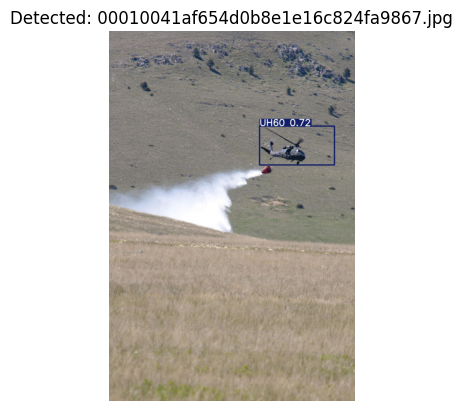


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000106393cfe2343888c584e65fd2274.jpg: 480x640 1 F16, 155.0ms
Speed: 7.0ms preprocess, 155.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


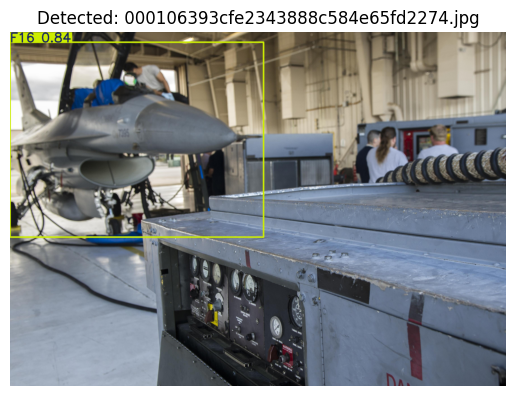


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0002f2cc10d90392efc3ad30cbda6490.jpg: 288x640 4 H6s, 209.6ms
Speed: 4.9ms preprocess, 209.6ms inference, 7.3ms postprocess per image at shape (1, 3, 288, 640)


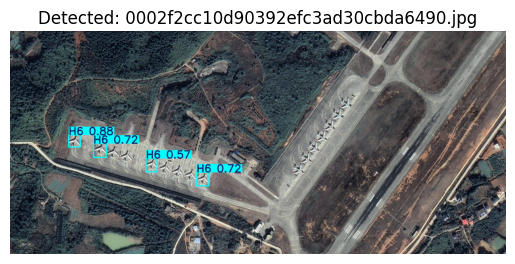


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00032844ab679240fc03ecd27d29a6aa.jpg: 480x640 (no detections), 74.8ms
Speed: 7.1ms preprocess, 74.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


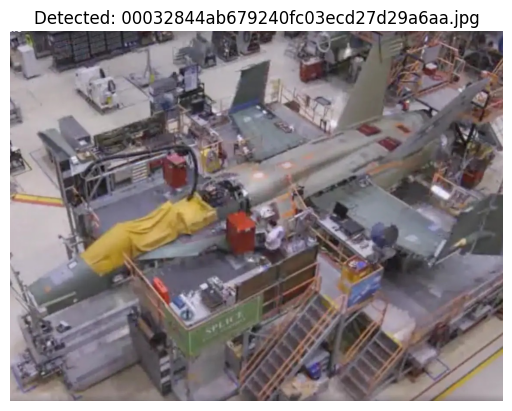


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0003f56298fa8999168d7988a2e9549d.jpg: 448x640 1 F22, 154.9ms
Speed: 7.6ms preprocess, 154.9ms inference, 6.9ms postprocess per image at shape (1, 3, 448, 640)


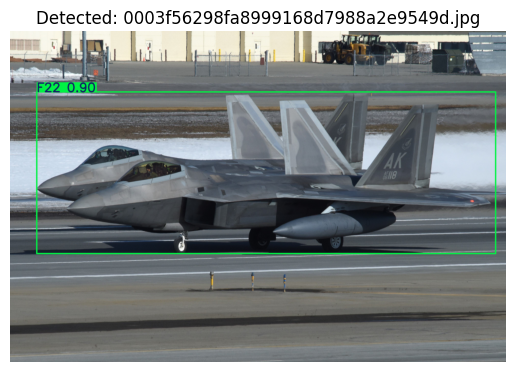


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000aa01b25574f28b654718db0700f72.jpg: 448x640 1 B52, 1 F35, 1 JAS39, 80.9ms
Speed: 7.5ms preprocess, 80.9ms inference, 4.0ms postprocess per image at shape (1, 3, 448, 640)


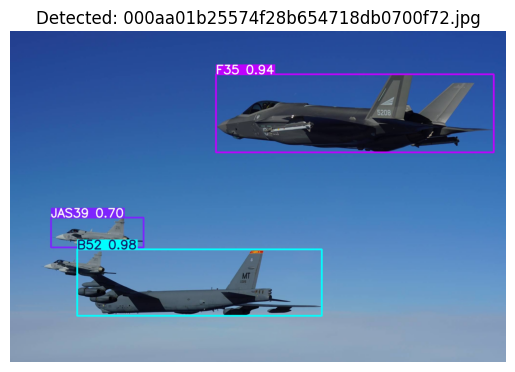


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000b7e09368a2500506063d27d90fcc0.jpg: 448x640 1 JH7, 76.5ms
Speed: 10.0ms preprocess, 76.5ms inference, 4.6ms postprocess per image at shape (1, 3, 448, 640)


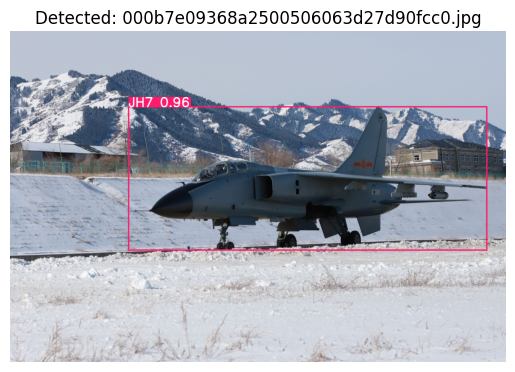


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000e7662268a1071827c5a8663e773f9.jpg: 480x640 1 US2, 83.2ms
Speed: 11.2ms preprocess, 83.2ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)


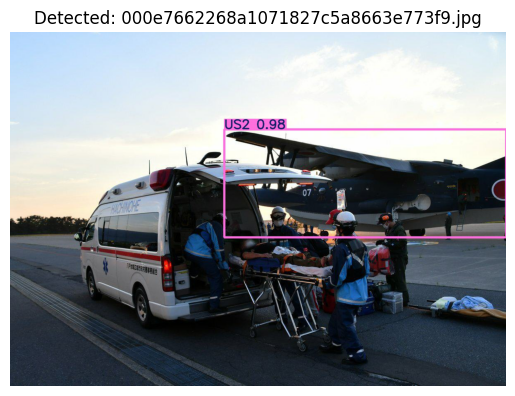


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000ec980b5b17156a55093b4bd6004ab.jpg: 384x640 1 Be200, 175.1ms
Speed: 7.9ms preprocess, 175.1ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)


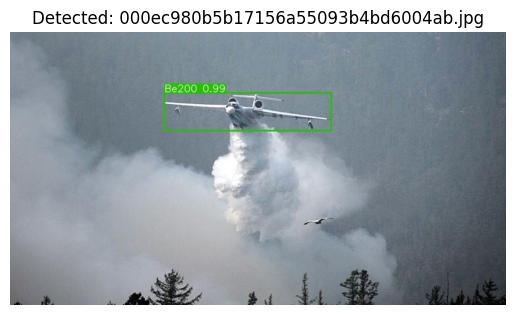


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0036c2784a5b8b2a4a1a4bd9109eb2f7.jpg: 416x640 (no detections), 176.3ms
Speed: 8.1ms preprocess, 176.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


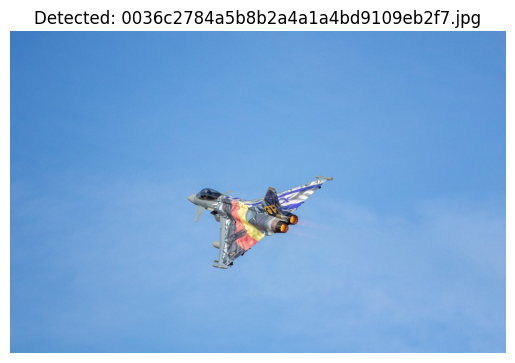

In [3]:
# Example usage
input_directory = r"C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images"
model_path = r"C:\\Users\\BISWAJIT\\Biswajit Kar\\runs\\detect\\yolo_aircraft_detection using YOLOv9\\weights\\best.pt"

# Get the first 10 image paths
image_paths = get_image_paths_from_directory(input_directory, num_images=10)

# Detect and display images
detect_and_display_images(image_paths, model_path)

## Applying YOLOv10s

In [5]:
from ultralytics import YOLO

# Load a pre-trained YOLO11 model 
model3 = YOLO(r"C:\Users\BISWAJIT\Downloads\yolov10s.pt")

# Train the model using the YAML configuration file
model3.train(
    data = r"C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml",  # Path to the YAML file
    imgsz= 640,                 # Image size for training
    epochs  = 30,                 # Number of epochs
    batch = 16,                  # Batch size
    name = 'yolo_aircraft_detection using YOLO10'  # Name for the training run
)

New https://pypi.org/project/ultralytics/8.3.23 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: task=detect, mode=train, model=C:\Users\BISWAJIT\Downloads\yolov10s.pt, data=C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolo_aircraft_detection using YOLO102, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False

train: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\train\labels.cache... 14186 images, 0 backgrounds, 0 corrupt
val: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\val\labels.cache... 1773 images, 0 backgrounds, 0 corrupt: 100


Plotting labels to runs\detect\yolo_aircraft_detection using YOLO102\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00013, momentum=0.9) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\yolo_aircraft_detection using YOLO102
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30       6.1G      1.855      12.21      2.322         42        640: 100%|██████████| 887/887 [11:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:03


                   all       1773       3141      0.276     0.0549     0.0312     0.0271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      6.04G      1.813      6.588      2.239         43        640: 100%|██████████| 887/887 [11:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:10


                   all       1773       3141      0.335      0.154     0.0815     0.0698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      6.16G      1.818      5.674      2.221         34        640: 100%|██████████| 887/887 [11:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:05


                   all       1773       3141      0.288      0.183       0.14      0.115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      5.98G      1.789      5.185      2.206         42        640: 100%|██████████| 887/887 [13:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:49


                   all       1773       3141      0.317       0.28      0.194      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.96G      1.724      4.727      2.181         46        640: 100%|██████████| 887/887 [11:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:00


                   all       1773       3141      0.384      0.273      0.253      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      5.93G      1.706      4.415      2.157         21        640: 100%|██████████| 887/887 [11:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:09


                   all       1773       3141      0.369      0.333      0.299      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30         6G      1.645      4.104      2.129         30        640: 100%|██████████| 887/887 [11:24<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:03


                   all       1773       3141      0.451       0.34      0.339      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      5.97G      1.614      3.914      2.114         31        640: 100%|██████████| 887/887 [11:26<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:49


                   all       1773       3141       0.44      0.379      0.374      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      6.06G      1.583      3.673      2.101         35        640: 100%|██████████| 887/887 [11:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:02


                   all       1773       3141       0.54      0.399      0.426      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.96G      1.563      3.494      2.083         41        640: 100%|██████████| 887/887 [10:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:22

                   all       1773       3141      0.537      0.454      0.467      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      6.09G      1.537      3.301      2.074         53        640: 100%|██████████| 887/887 [10:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:59


                   all       1773       3141      0.516      0.448      0.466      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       6.1G      1.507      3.146      2.062         31        640: 100%|██████████| 887/887 [11:51<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:32


                   all       1773       3141      0.577      0.452      0.498      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      6.15G      1.482      2.998       2.05         36        640: 100%|██████████| 887/887 [11:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:00


                   all       1773       3141      0.575      0.462      0.533       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      6.04G      1.465      2.886      2.032         22        640: 100%|██████████| 887/887 [11:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:14


                   all       1773       3141      0.621      0.473      0.534      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      5.95G      1.452      2.749      2.026         43        640: 100%|██████████| 887/887 [11:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:02


                   all       1773       3141      0.575      0.545       0.59      0.524

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      6.13G      1.426      2.633      2.022         27        640: 100%|██████████| 887/887 [11:30<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:31

                   all       1773       3141      0.609      0.541      0.586      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      5.94G      1.392      2.521      2.005         54        640: 100%|██████████| 887/887 [13:24<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:03


                   all       1773       3141      0.594       0.55      0.584      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      5.96G      1.389      2.445      2.001         80        640: 100%|██████████| 887/887 [11:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:36


                   all       1773       3141      0.657      0.568      0.621      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      5.98G      1.382      2.351      1.996         40        640: 100%|██████████| 887/887 [10:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:59


                   all       1773       3141      0.751      0.528      0.637      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30       6.1G      1.355      2.263      1.984         37        640: 100%|██████████| 887/887 [13:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:32

                   all       1773       3141      0.723      0.562       0.65      0.575


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      5.94G      1.089      1.551      1.827         17        640: 100%|██████████| 887/887 [10:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:57


                   all       1773       3141        0.7      0.552      0.638      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.96G      1.069      1.448      1.812         11        640: 100%|██████████| 887/887 [09:42<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:32


                   all       1773       3141      0.698      0.576      0.654      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.92G      1.053       1.37      1.798         16        640: 100%|██████████| 887/887 [09:22<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:54


                   all       1773       3141      0.724      0.577      0.669        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      6.03G      1.029      1.278      1.782         12        640: 100%|██████████| 887/887 [10:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:27


                   all       1773       3141      0.742      0.568      0.669      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      6.14G      1.022      1.221      1.776         13        640: 100%|██████████| 887/887 [09:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:52


                   all       1773       3141      0.706      0.592      0.678      0.608

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      6.06G     0.9884      1.147       1.77         13        640: 100%|██████████| 887/887 [11:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:31


                   all       1773       3141      0.791      0.556      0.683      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      5.95G     0.9686      1.086      1.758         33        640: 100%|██████████| 887/887 [25:28<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:41


                   all       1773       3141      0.757      0.579      0.686      0.614

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      6.13G     0.9645      1.057      1.754         16        640: 100%|██████████| 887/887 [10:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [02:14


                   all       1773       3141      0.732      0.593      0.692      0.617

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.94G     0.9433      1.015      1.745         12        640: 100%|██████████| 887/887 [13:30<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:06


                   all       1773       3141      0.753      0.591      0.691       0.62

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      6.12G     0.9346     0.9628      1.741         15        640: 100%|██████████| 887/887 [08:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [01:10


                   all       1773       3141      0.776      0.586      0.694      0.623

30 epochs completed in 6.516 hours.
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLO102\weights\last.pt, 16.6MB
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLO102\weights\best.pt, 16.6MB

Validating runs\detect\yolo_aircraft_detection using YOLO102\weights\best.pt...
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
YOLOv10s summary (fused): 293 layers, 8,091,462 parameters, 0 gradients, 24.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:40


                   all       1773       3141      0.775      0.586      0.693      0.622
                   A10         51         78      0.938      0.628      0.778      0.686
                 A400M         33         45      0.739      0.733      0.762      0.699
                 AG600         19         19          1      0.815      0.894      0.847
                  AH64         21         30      0.646        0.6      0.662      0.485
                  AV8B         35         50      0.725       0.62      0.693      0.656
                 An124          5          6      0.516      0.361      0.519      0.491
                  An22          1          1      0.403          1      0.995      0.995
                 An225          4          4      0.385       0.25      0.202      0.164
                  An72         15         20          1       0.61      0.804       0.67
                    B1         55         86      0.881      0.651      0.807      0.725
                    B

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000208BF0AEB50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026, 

### Detecting Aircrafts


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00010041af654d0b8e1e16c824fa9867.jpg: 640x448 1 UH60, 82.0ms
Speed: 6.0ms preprocess, 82.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)


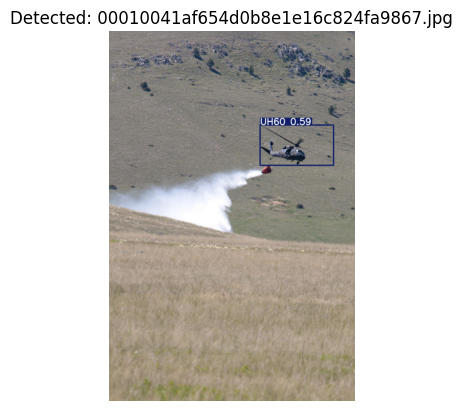


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000106393cfe2343888c584e65fd2274.jpg: 480x640 1 F16, 64.6ms
Speed: 7.0ms preprocess, 64.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


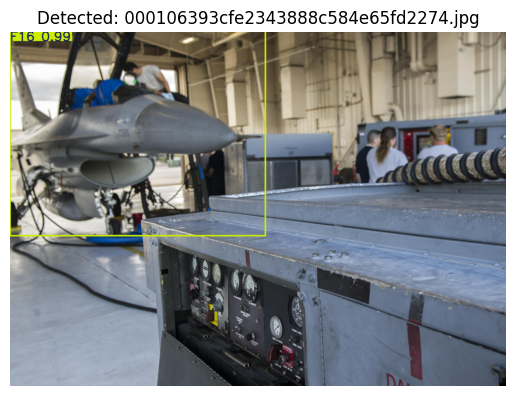


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0002f2cc10d90392efc3ad30cbda6490.jpg: 288x640 14 H6s, 75.8ms
Speed: 6.0ms preprocess, 75.8ms inference, 3.0ms postprocess per image at shape (1, 3, 288, 640)


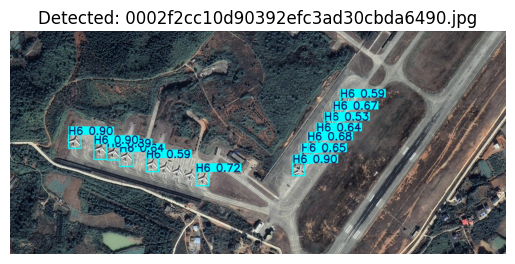


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00032844ab679240fc03ecd27d29a6aa.jpg: 480x640 1 F18, 53.2ms
Speed: 7.0ms preprocess, 53.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


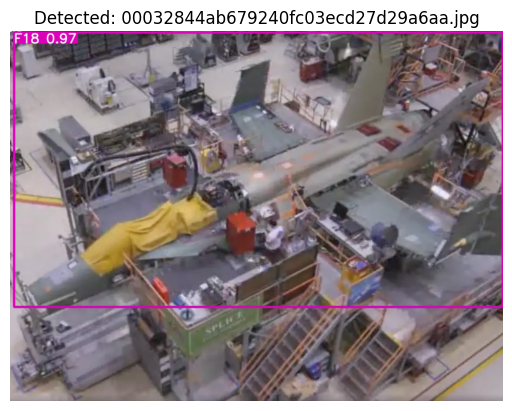


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0003f56298fa8999168d7988a2e9549d.jpg: 448x640 1 F22, 61.0ms
Speed: 7.0ms preprocess, 61.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


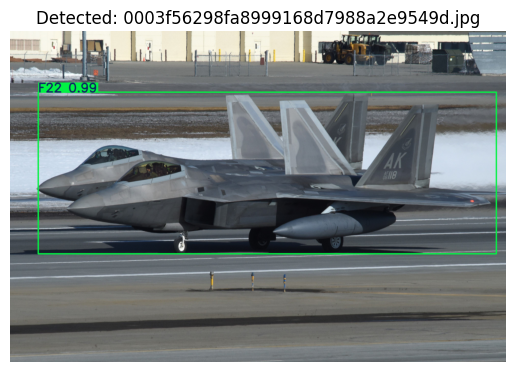


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000aa01b25574f28b654718db0700f72.jpg: 448x640 1 B52, 1 F35, 2 JAS39s, 50.4ms
Speed: 7.0ms preprocess, 50.4ms inference, 3.0ms postprocess per image at shape (1, 3, 448, 640)


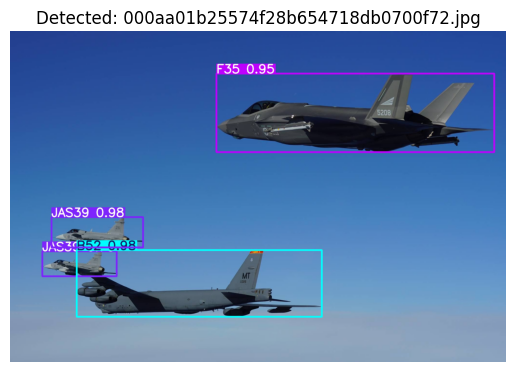


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000b7e09368a2500506063d27d90fcc0.jpg: 448x640 1 JH7, 50.0ms
Speed: 8.1ms preprocess, 50.0ms inference, 3.9ms postprocess per image at shape (1, 3, 448, 640)


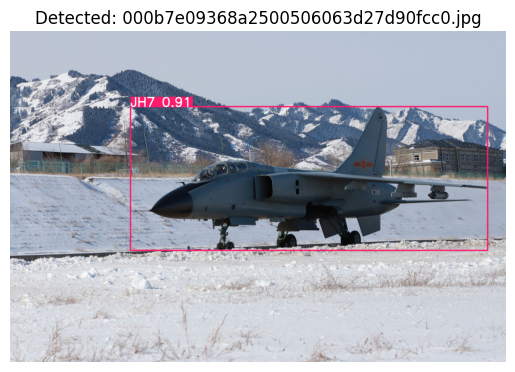


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000e7662268a1071827c5a8663e773f9.jpg: 480x640 1 US2, 54.6ms
Speed: 9.1ms preprocess, 54.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


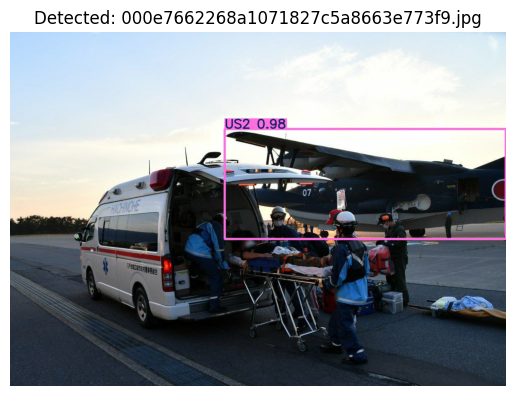


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000ec980b5b17156a55093b4bd6004ab.jpg: 384x640 1 Be200, 52.1ms
Speed: 6.0ms preprocess, 52.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


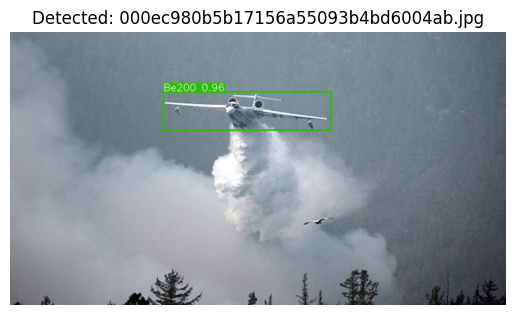


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0036c2784a5b8b2a4a1a4bd9109eb2f7.jpg: 416x640 1 EF2000, 73.3ms
Speed: 7.1ms preprocess, 73.3ms inference, 5.0ms postprocess per image at shape (1, 3, 416, 640)


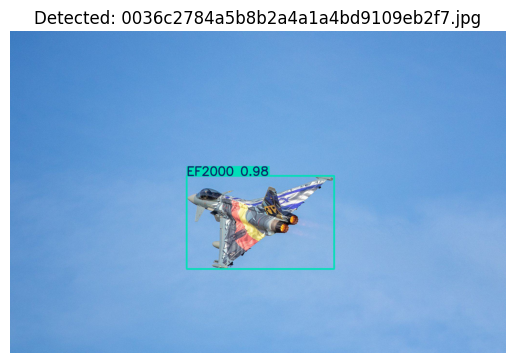

In [4]:
# Example usage
input_directory = r"C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images"
model_path = r"C:\\Users\\BISWAJIT\\Biswajit Kar\\runs\\detect\\yolo_aircraft_detection using YOLO10\\weights\\best.pt"

# Get the first 10 image paths
image_paths = get_image_paths_from_directory(input_directory, num_images=10)

# Detect and display images
detect_and_display_images(image_paths, model_path)

## Applying YOLO 11s

In [3]:
from ultralytics import YOLO

# Load a pre-trained YOLO11 model 
model1 = YOLO('yolo11s.pt')

# Train the model using the YAML configuration file
model1.train(
    data = r"C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml",  # Path to the YAML file
    imgsz= 640,                 # Image size for training
    epochs  = 30,                 # Number of epochs
    batch = 16,                  # Batch size
    name = 'yolo_aircraft_detection using YOLO11'  # Name for the training run
)

New https://pypi.org/project/ultralytics/8.3.23 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: task=detect, mode=train, model=yolo11s.pt, data=C:\Users\BISWAJIT\Desktop\Military Aircraft Dataset.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolo_aircraft_detection using YOLO112, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms

train: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\train\labels.cache... 14186 images, 0 backgrounds, 0 corrupt
val: Scanning C:\Users\BISWAJIT\Desktop\Aircraft Dataset\val\labels.cache... 1773 images, 0 backgrounds, 0 corrupt: 100


Plotting labels to runs\detect\yolo_aircraft_detection using YOLO112\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00013, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\yolo_aircraft_detection using YOLO112
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      4.46G     0.9192      4.318      1.204         42        640: 100%|██████████| 887/887 [04:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:14


                   all       1773       3141      0.229      0.107     0.0497     0.0422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.58G      0.861      3.029      1.138         43        640: 100%|██████████| 887/887 [04:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.274      0.213      0.139      0.114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.68G     0.8443      2.651      1.122         34        640: 100%|██████████| 887/887 [04:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.345      0.259      0.202      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      4.53G     0.8153      2.401      1.104         42        640: 100%|██████████| 887/887 [04:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.294       0.31       0.24      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      4.49G     0.7823      2.197      1.088         46        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.344      0.344      0.298       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.56G     0.7722      2.036      1.076         21        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.471      0.369      0.366      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.57G      0.748      1.892      1.065         30        640: 100%|██████████| 887/887 [04:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.505      0.378      0.406       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.59G     0.7337      1.787      1.056         31        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.483      0.426      0.437      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.57G     0.7203      1.666      1.048         35        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.601      0.445      0.495       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      4.58G      0.704      1.589      1.037         41        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.566      0.498      0.534      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.53G     0.6939      1.502      1.033         53        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.622      0.469      0.555      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.56G     0.6805      1.429      1.027         31        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141       0.58      0.545      0.578      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.65G       0.67      1.352      1.022         36        640: 100%|██████████| 887/887 [04:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.614      0.533      0.579       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.66G     0.6605      1.299      1.013         22        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.654      0.523      0.613      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.55G     0.6534      1.244      1.008         43        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.713      0.518      0.627      0.554

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      4.57G     0.6433      1.181      1.006         27        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.685      0.564      0.652      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      4.47G     0.6284      1.135     0.9977         54        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.639      0.594      0.656      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       4.5G     0.6227      1.095     0.9944         80        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.672      0.622      0.672      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       4.6G     0.6194      1.055     0.9916         40        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.719      0.571      0.676      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      4.56G     0.6092      1.015     0.9871         37        640: 100%|██████████| 887/887 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141       0.75      0.595      0.694      0.615


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      4.48G     0.4896     0.7093     0.9122         17        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141       0.72      0.605      0.692      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30       4.5G     0.4771     0.6609     0.9036         11        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.753      0.582       0.69      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      4.54G     0.4676     0.6221     0.8968         16        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.713      0.644      0.709      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      4.64G     0.4623      0.584     0.8918         12        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.737      0.619      0.707       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      4.58G     0.4556     0.5535     0.8888         13        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141       0.76      0.622      0.718      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      4.59G      0.442     0.5278     0.8848         13        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.735      0.643      0.716      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      4.49G     0.4332     0.4994     0.8821         33        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.739      0.636       0.72      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      4.68G     0.4295     0.4772     0.8776         16        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.749      0.633      0.721      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      4.62G     0.4203     0.4601     0.8733         12        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.786       0.61      0.724       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      4.67G     0.4169     0.4456     0.8712         15        640: 100%|██████████| 887/887 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13

                   all       1773       3141      0.782      0.615      0.727      0.653



30 epochs completed in 2.143 hours.
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLO112\weights\last.pt, 19.2MB
Optimizer stripped from runs\detect\yolo_aircraft_detection using YOLO112\weights\best.pt, 19.2MB

Validating runs\detect\yolo_aircraft_detection using YOLO112\weights\best.pt...
Ultralytics 8.3.18  Python-3.8.18 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
YOLO11s summary (fused): 238 layers, 9,441,051 parameters, 0 gradients, 21.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:13


                   all       1773       3141      0.781      0.617      0.727      0.653
                   A10         51         78      0.834      0.538      0.726      0.648
                 A400M         33         45      0.906      0.689       0.82      0.756
                 AG600         19         19      0.904      0.842      0.915      0.876
                  AH64         21         30      0.617      0.751      0.733      0.562
                  AV8B         35         50      0.785      0.728      0.752      0.709
                 An124          5          6      0.616        0.5      0.572      0.555
                  An22          1          1      0.681          1      0.995      0.995
                 An225          4          4      0.375       0.25      0.335      0.325
                  An72         15         20      0.889       0.35      0.707      0.639
                    B1         55         86      0.808      0.687      0.802      0.707
                    B

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000025373A46400>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026, 

### Detecting Aircrafts


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00010041af654d0b8e1e16c824fa9867.jpg: 640x448 1 UH60, 76.4ms
Speed: 7.1ms preprocess, 76.4ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 448)


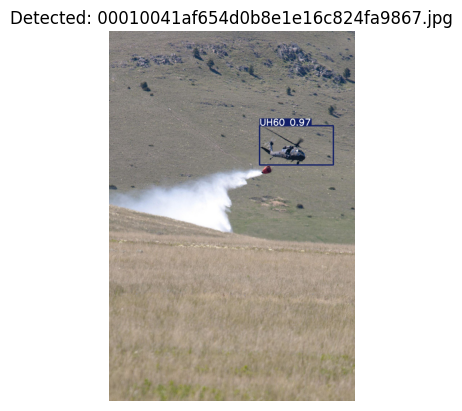


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000106393cfe2343888c584e65fd2274.jpg: 480x640 1 F16, 103.0ms
Speed: 10.6ms preprocess, 103.0ms inference, 6.5ms postprocess per image at shape (1, 3, 480, 640)


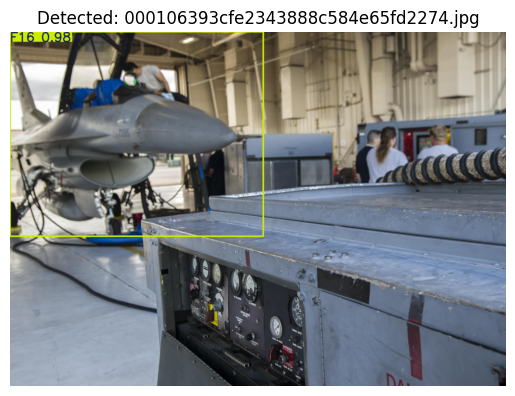


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0002f2cc10d90392efc3ad30cbda6490.jpg: 288x640 17 H6s, 79.8ms
Speed: 6.3ms preprocess, 79.8ms inference, 4.5ms postprocess per image at shape (1, 3, 288, 640)


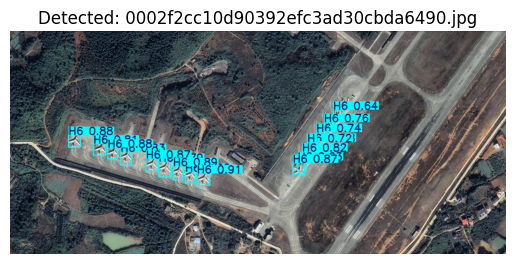


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\00032844ab679240fc03ecd27d29a6aa.jpg: 480x640 1 F18, 50.6ms
Speed: 7.1ms preprocess, 50.6ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)


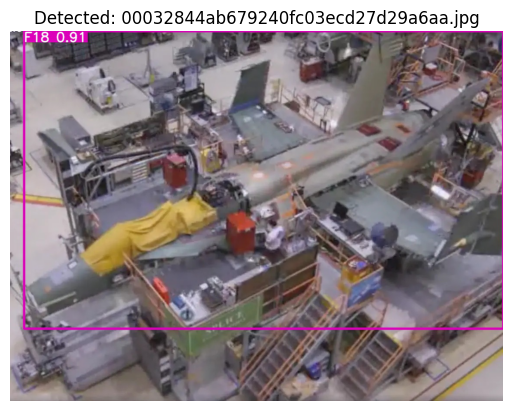


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0003f56298fa8999168d7988a2e9549d.jpg: 448x640 2 F22s, 107.1ms
Speed: 10.3ms preprocess, 107.1ms inference, 5.3ms postprocess per image at shape (1, 3, 448, 640)


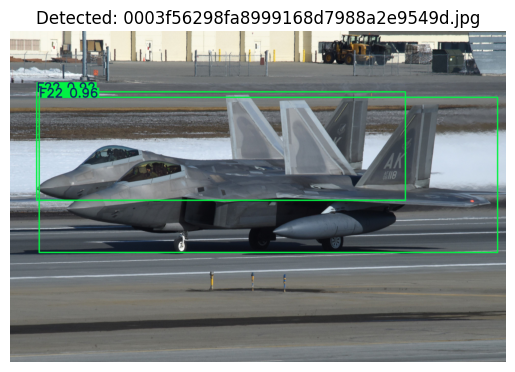


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000aa01b25574f28b654718db0700f72.jpg: 448x640 1 B52, 1 F35, 2 JAS39s, 46.0ms
Speed: 8.0ms preprocess, 46.0ms inference, 7.0ms postprocess per image at shape (1, 3, 448, 640)


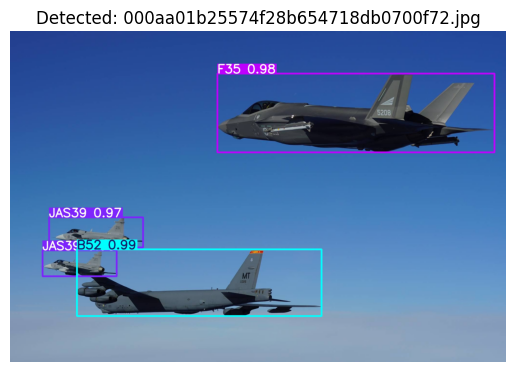


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000b7e09368a2500506063d27d90fcc0.jpg: 448x640 1 JH7, 45.0ms
Speed: 7.0ms preprocess, 45.0ms inference, 6.3ms postprocess per image at shape (1, 3, 448, 640)


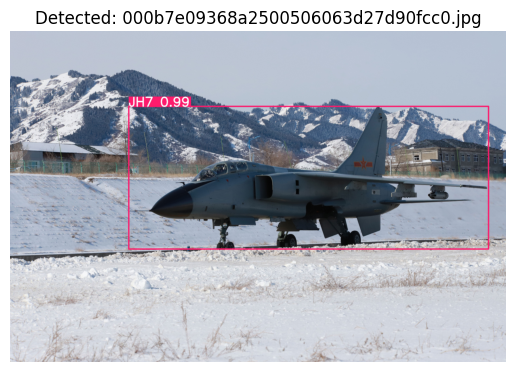


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000e7662268a1071827c5a8663e773f9.jpg: 480x640 1 US2, 49.7ms
Speed: 10.1ms preprocess, 49.7ms inference, 4.2ms postprocess per image at shape (1, 3, 480, 640)


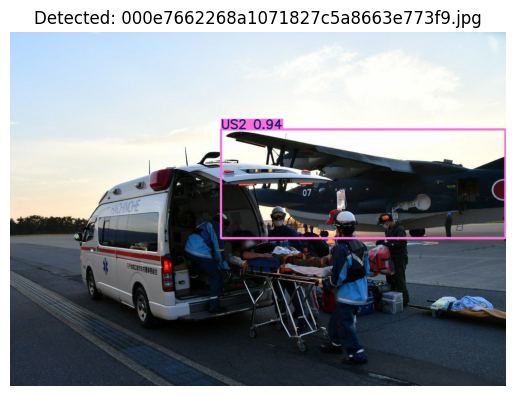


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\000ec980b5b17156a55093b4bd6004ab.jpg: 384x640 2 Be200s, 80.1ms
Speed: 10.0ms preprocess, 80.1ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)


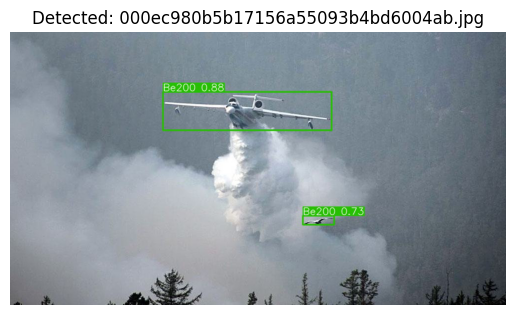


image 1/1 C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images\0036c2784a5b8b2a4a1a4bd9109eb2f7.jpg: 416x640 1 EF2000, 73.8ms
Speed: 12.0ms preprocess, 73.8ms inference, 8.0ms postprocess per image at shape (1, 3, 416, 640)


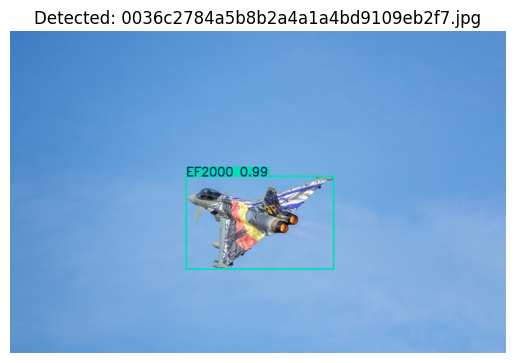

In [5]:
# Example usage
input_directory = r"C:\Users\BISWAJIT\Desktop\Aircraft Dataset\images"
model_path = r"C:\\Users\\BISWAJIT\\Biswajit Kar\\runs\\detect\\yolo_aircraft_detection using YOLO11\\weights\\best.pt"

# Get the first 10 image paths
image_paths = get_image_paths_from_directory(input_directory, num_images=10)

# Detect and display images
detect_and_display_images(image_paths, model_path)